In [3]:
import warnings
warnings.filterwarnings("ignore")

print("완료!")

완료!


In [4]:
import tensorflow as tf
print(tf.__version__)

2.10.0


In [5]:
import tensorflow_datasets as tfds

tfds.__version__

'4.8.0'

In [8]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    download=True,
    with_info=True,
    as_supervised=True,
)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling C:\Users\YJKIM_PC\tensorflow_datasets\tf_flowers\3.0.1.incompleteELPP4D\tf_flowers-train.tfrecord*..…

Dataset tf_flowers downloaded and prepared to C:\Users\YJKIM_PC\tensorflow_datasets\tf_flowers\3.0.1. Subsequent calls will reuse this data.


In [28]:
print(len(raw_train))
print(len(raw_validation))
print(len(raw_test))

2936
367
367


In [ ]:
print(raw_train.)

In [11]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print("슝~")

슝~


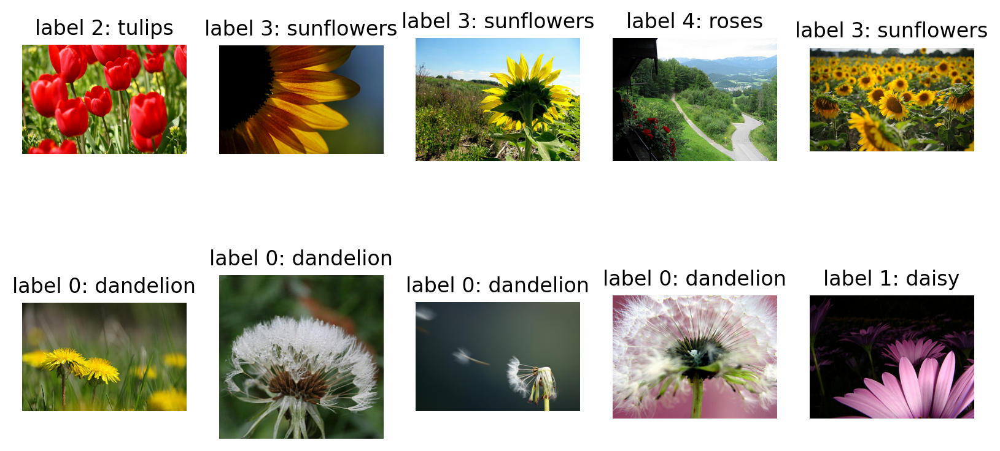

In [12]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [13]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

print("슝~")

슝~


In [14]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


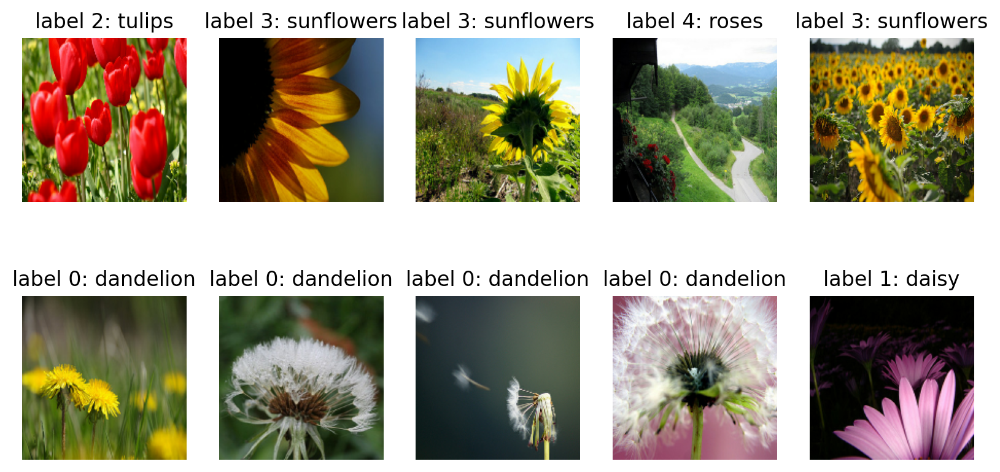

In [15]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [16]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

print("슝~")

슝~


In [33]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

print("슝~")

슝~


In [34]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 80, 80, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 40, 40, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 20, 20, 64)      

In [35]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

print("슝~")

슝~


In [36]:
BATCH_SIZE = 20
SHUFFLE_BUFFER_SIZE = 1000
print("슝~")

슝~


In [37]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)
print("슝~")

슝~


In [38]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([20, 160, 160, 3]), TensorShape([20]))

In [39]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

16/20 [=======================>......] - ETA: 0s - loss: 1.6353 - accuracy: 0.2344WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 1s 11ms/step - loss: 1.6299 - accuracy: 0.2289
initial loss: 1.63
initial accuracy: 0.23


In [40]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
147/147 [==============================] - 9s 29ms/step - loss: 1.3073 - accuracy: 0.4462 - val_loss: 1.1235 - val_accuracy: 0.5041
Epoch 2/10
147/147 [==============================] - 4s 23ms/step - loss: 1.0298 - accuracy: 0.5875 - val_loss: 1.0040 - val_accuracy: 0.6076
Epoch 3/10
147/147 [==============================] - 4s 25ms/step - loss: 0.8920 - accuracy: 0.6550 - val_loss: 1.1004 - val_accuracy: 0.5422
Epoch 4/10
147/147 [==============================] - 4s 24ms/step - loss: 0.7665 - accuracy: 0.7173 - val_loss: 0.9394 - val_accuracy: 0.6267
Epoch 5/10
147/147 [==============================] - 4s 28ms/step - loss: 0.6671 - accuracy: 0.7633 - val_loss: 1.0150 - val_accuracy: 0.6131
Epoch 6/10
147/147 [==============================] - 4s 23ms/step - loss: 0.5718 - accuracy: 0.7936 - val_loss: 0.9560 - val_accuracy: 0.6431
Epoch 7/10
147/147 [==============================] - 4s 25ms/step - loss: 0.4825 - accuracy: 0.8365 - val_loss: 0.9072 - val_accuracy: 0.6512

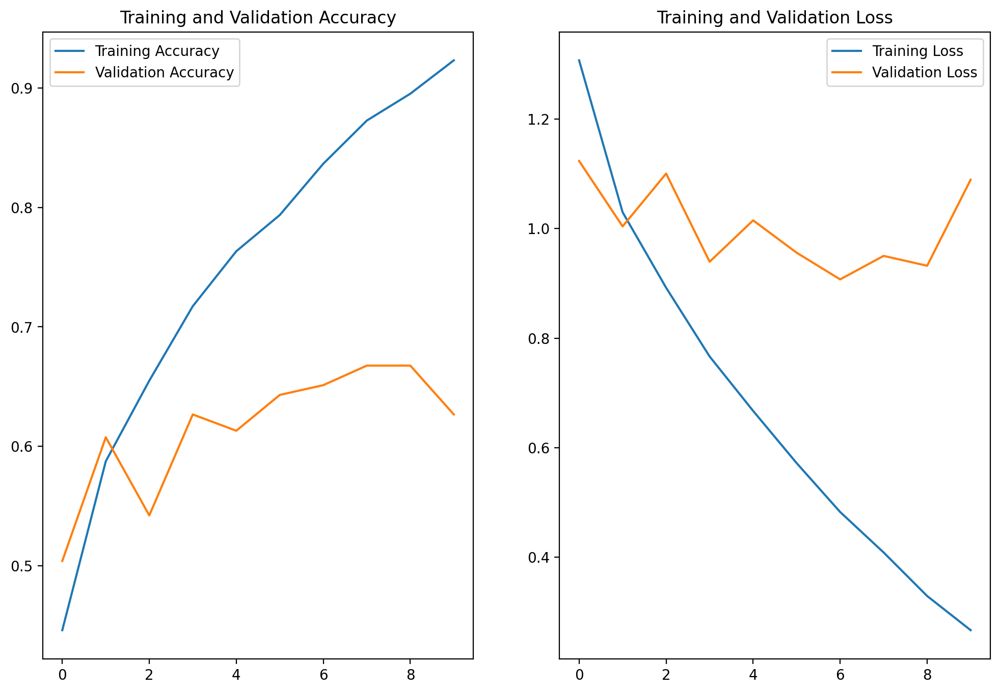

In [41]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [42]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

1/1 [==============================] - 0s 147ms/step


array([[2.94031557e-02, 8.37276038e-03, 5.84673524e-01, 1.44173637e-01,
        2.33377010e-01],
       [7.80313611e-01, 2.17898667e-01, 9.81833902e-04, 7.23017774e-06,
        7.98580528e-04],
       [9.73703921e-01, 6.09397423e-03, 1.10825310e-02, 8.65533110e-03,
        4.64179786e-04],
       [2.38340292e-02, 1.17872067e-01, 5.06182313e-01, 2.05615419e-03,
        3.50055426e-01],
       [9.05308843e-01, 1.49452062e-02, 1.50135458e-02, 5.22264838e-03,
        5.95097318e-02],
       [9.35618103e-01, 3.01566254e-02, 4.32903552e-03, 1.24623743e-03,
        2.86498908e-02],
       [2.45848112e-02, 1.10511549e-01, 8.22023690e-01, 1.67415407e-03,
        4.12057973e-02],
       [6.73546076e-01, 7.13926926e-02, 2.10375283e-02, 3.70662007e-03,
        2.30317146e-01],
       [2.99564213e-01, 1.26654195e-04, 3.83714214e-03, 6.95787847e-01,
        6.84099330e-04],
       [9.99257028e-01, 5.78413019e-04, 8.29293276e-06, 5.00621695e-07,
        1.55695408e-04],
       [9.99695301e-01, 1.5784

In [47]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 2, 0, 3, 0, 0, 0, 3, 4, 0, 3, 2, 0, 0, 4],
      dtype=int64)

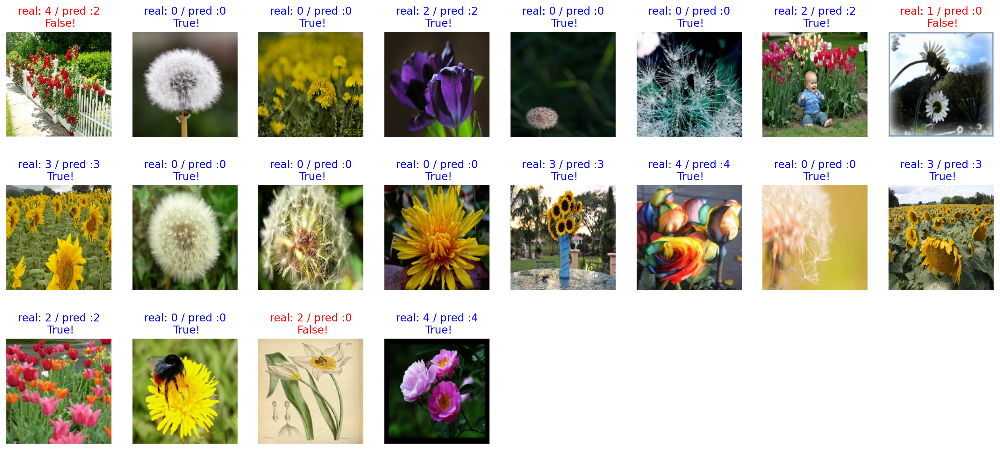

In [48]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [50]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct == True:
        count += 1

print(count / 20 * 100)

85.0


In [101]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [102]:
image_batch.shape

TensorShape([20, 160, 160, 3])

In [103]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([20, 5, 5, 512])

In [104]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 160, 160, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 160, 160, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 80, 80, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 80, 80, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 80, 80, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 40, 40, 128)       0     

In [105]:
feature_batch.shape

TensorShape([20, 5, 5, 512])

In [106]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
print("슝~")

슝~


In [107]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(20, 512)


In [108]:
# dense layer에는 unit과 activation 2개의 매개변수만 사용해주세요.
# unit의 값은 위에서 global_average_layer를 통과했을 때의 값을 생각해보세요.
# 활성화 함수는 ReLU를 사용합니다.
dense_layer = tf.keras.layers.Dense(512, activation='relu')
# unit은 우리가 분류하고 싶은 class를 생각해보세요.
# 활성화 함수는 Softmax를 사용합니다.
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(20, 5)


In [109]:
base_model.trainable = False
print("슝~")

슝~


In [110]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])
print("슝~")

슝~


In [156]:
base_learning_rate = 0.1
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [157]:
validation_steps=10
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

10/10 [==============================] - 1s 63ms/step - loss: 0.4258 - accuracy: 0.8500
initial loss: 0.43
initial accuracy: 0.85


In [159]:
EPOCHS = 10   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
147/147 [==============================] - 11s 73ms/step - loss: 0.1438 - accuracy: 0.9639 - val_loss: 0.4662 - val_accuracy: 0.8556
Epoch 2/10
147/147 [==============================] - 11s 72ms/step - loss: 0.1442 - accuracy: 0.9646 - val_loss: 0.4598 - val_accuracy: 0.8474
Epoch 3/10
147/147 [==============================] - 9s 56ms/step - loss: 0.1376 - accuracy: 0.9646 - val_loss: 0.4699 - val_accuracy: 0.8392
Epoch 4/10
147/147 [==============================] - 10s 66ms/step - loss: 0.1350 - accuracy: 0.9697 - val_loss: 0.4521 - val_accuracy: 0.8556
Epoch 5/10
147/147 [==============================] - 10s 68ms/step - loss: 0.1316 - accuracy: 0.9693 - val_loss: 0.4738 - val_accuracy: 0.8365
Epoch 6/10
147/147 [==============================] - 11s 74ms/step - loss: 0.1297 - accuracy: 0.9693 - val_loss: 0.4716 - val_accuracy: 0.8420
Epoch 7/10
147/147 [==============================] - 10s 67ms/step - loss: 0.1271 - accuracy: 0.9704 - val_loss: 0.4797 - val_accuracy: 

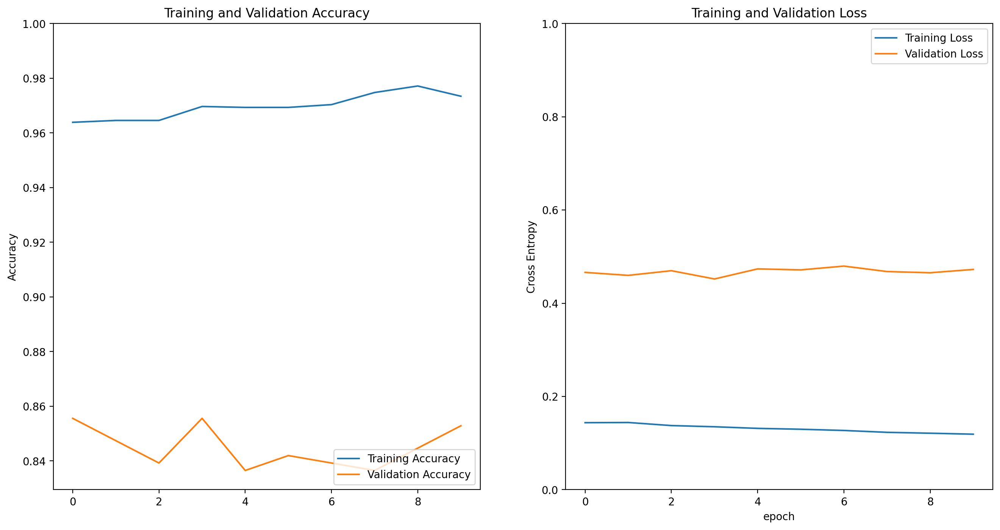

In [160]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [161]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

1/1 [==============================] - 0s 427ms/step


array([[9.12356627e-05, 4.08123218e-04, 9.83842492e-01, 8.20566434e-04,
        1.48376375e-02],
       [9.99999404e-01, 6.49938499e-07, 1.38089063e-11, 4.69690453e-10,
        1.46553223e-08],
       [4.01569724e-01, 1.40406057e-01, 1.58150308e-02, 4.28211510e-01,
        1.39977382e-02],
       [1.98891303e-06, 4.72572719e-05, 7.55594194e-01, 8.89582043e-06,
        2.44347647e-01],
       [8.02732289e-01, 1.90185994e-01, 1.83184457e-03, 2.24022521e-03,
        3.00965458e-03],
       [9.91662264e-01, 5.58611471e-03, 2.49489385e-04, 2.48141098e-03,
        2.06633940e-05],
       [9.85172956e-05, 9.61937167e-06, 9.97173905e-01, 5.04193536e-04,
        2.21380196e-03],
       [9.98445451e-02, 8.97520900e-01, 7.25385416e-06, 2.55373330e-03,
        7.36282163e-05],
       [4.85478813e-05, 2.36594110e-06, 2.62760185e-03, 9.95129585e-01,
        2.19184626e-03],
       [9.99992490e-01, 7.52657570e-06, 7.46070650e-10, 4.38250716e-08,
        3.38550388e-09],
       [9.86225009e-01, 1.2730

In [162]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 3, 2, 0, 0, 2, 1, 3, 0, 0, 0, 3, 4, 0, 3, 2, 0, 2, 4],
      dtype=int64)

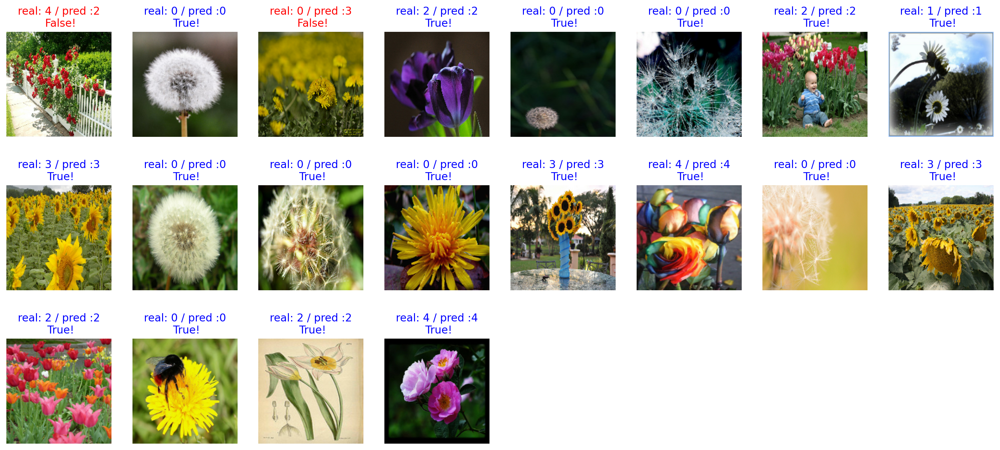

In [163]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [165]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 20 * 100)

90.0
